In [182]:
#导入相关包

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime
import string
from scipy import stats

In [177]:
#导入数据

#后续绘图以电动车数据为基础
dfe = pd.read_excel('./cleaned_car_all.xlsx', sheet_name='electric')

In [186]:
#导入函数

#保值率计算函数
def rate_residual(df):
    df['rate_residual'] = df['price']/df['price_new']
    return(df)

#新车价格对数化函数
def price_log(df):
    df['price_log'] = df['price_new'].apply(np.log1p)
    return(df)

#车龄计算函数
def num_day(df):
    now=datetime(2022,11,11)
    df['date_regi']=df['date_regi'].apply(lambda x: datetime.strptime(x, '%Y-%m'))
    df['num_day']=df['date_regi'].apply(lambda x: now-x)
    df['num_day']=df['num_day'].apply(lambda x: x.days)
    return(df)

#里程车龄偏差率计算函数
##从多元线性回归模型可以看出车龄对预测保值率的贡献远大于里程，猜想是因为里程表读数容易被篡改
##自然可以联想到，车龄和里程数有较强的正相关关系，如果某一辆车这两者相差过大，我们怀疑有造假的可能，其价格可能会偏低
###方法一：构造简单线性回归，用车龄预测里程数，看偏差比率
def mile_diff(df):
    model = LinearRegression()

    x = df[['num_day']]
    y = df[['mileage']]

    model.fit(x,y)

    df['predict_mileage'] = model.predict(df[['num_day']])
    df['mile_diff'] = df['predict_mileage'] - df['mileage'] 
    df['mile_diff'] = 2*df['mile_diff'] / (df['predict_mileage'] + df['mileage'])
    return(df)
    
###方法二：用里程数除以车龄，得到每天行驶里程
def mileperday(df):
    df['mileperday'] = df['mileage'] / df['num_day']
    return(df)

#品牌占比计算函数，代表该车的市场保有量
def brand_ratio(df):
    df['brand_ratio'] = df['brand'].apply(lambda x: df['brand'].value_counts()[x]/32018)
    return(df)

#标题长度计算函数
def len_title(df):
    df['len'] = df['title'].apply(lambda x: len(x))
    return(df)

In [179]:
#构造新特征
dfe = mile_diff(dfe)
dfe = brand_ratio(dfe)
dfe = mile_diff(dfe)
dfe = len_title(dfe)

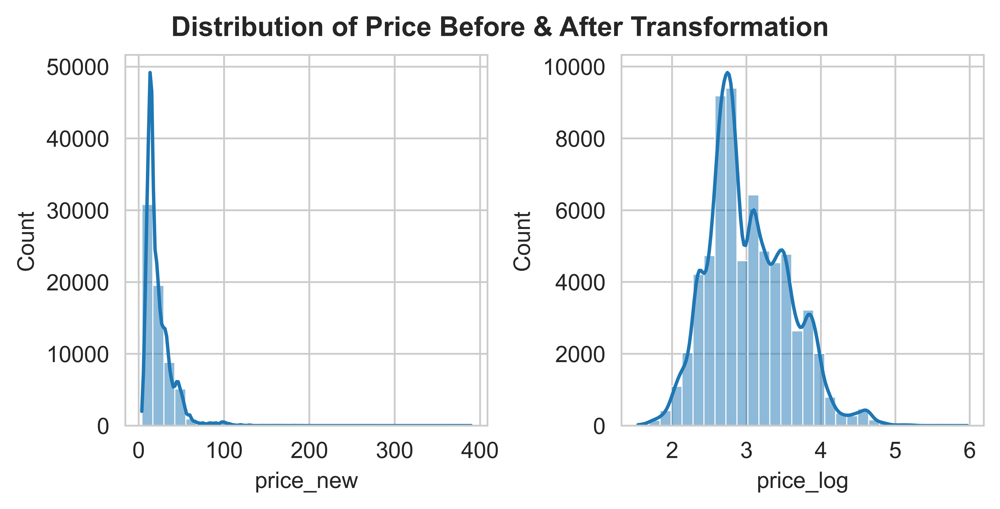

In [180]:
#新车价格取对数前后分布图
sns.set_style('whitegrid')
fig, ax = plt.subplots(1,2,constrained_layout=True, figsize=(6, 3), dpi=1080)
axesSUB = sns.histplot(dff['price_new'],bins=30,kde=True, ax=ax[0])
axesSUB = sns.histplot(dff['price_log'],bins=30,kde=True, ax=ax[1])

plt.suptitle('Distribution of Price Before & After Transformation',fontweight='bold')
plt.savefig('Distribution of Price Before & After Transformation', dpi=1080)
plt.show()

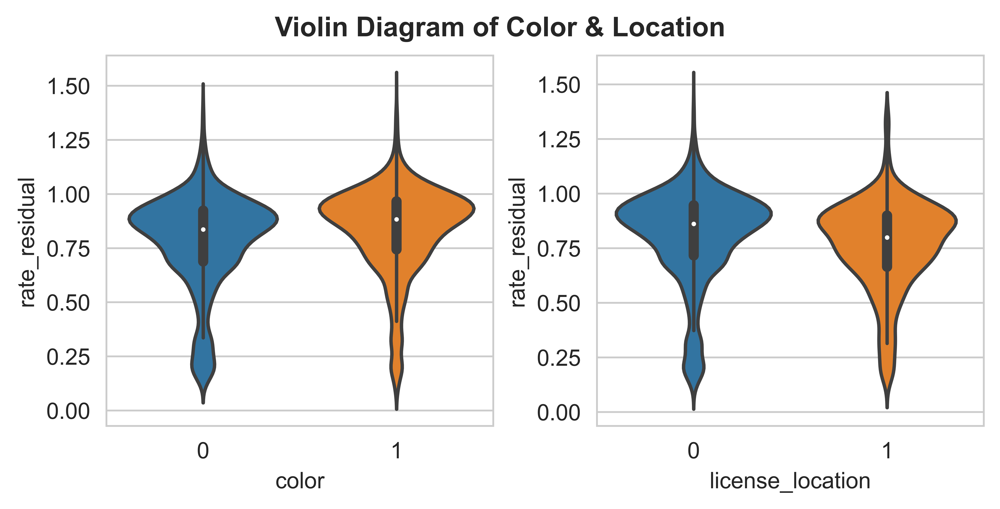

In [181]:
#颜色与车牌所在地保值率分布提琴图
fig, ax = plt.subplots(1,2,constrained_layout=True, figsize=(6, 3), dpi=1080)

axesSUB = sns.violinplot(dfe,y='rate_residual',x='color',split=True,ax=ax[0])
axesSUB = sns.violinplot(dfe,y='rate_residual',x='license_location',split=True,ax=ax[1])

plt.suptitle('Violin Diagram of Color & Location',fontweight='bold',)
plt.savefig('Violin Diagram of Color & Location', dpi=1080)
plt.show()

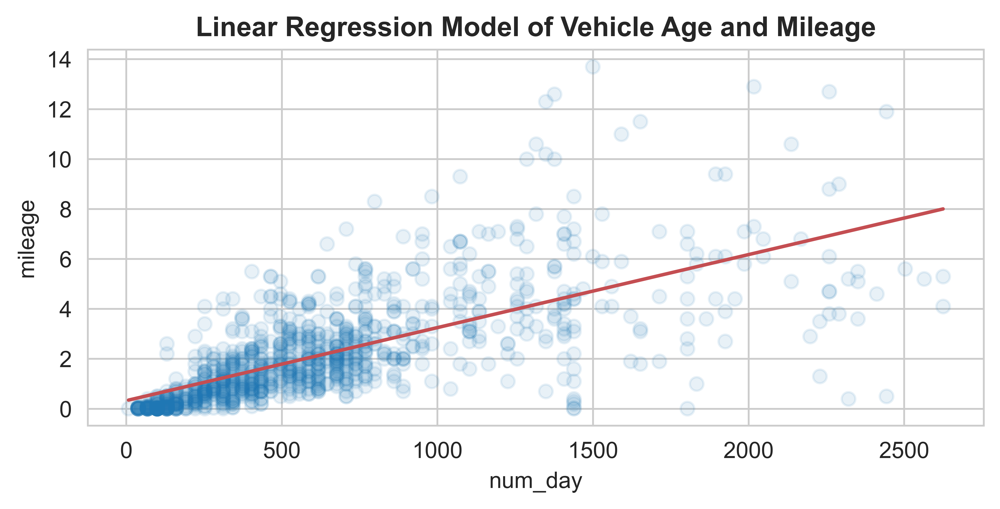

In [183]:
#车龄与里程数简单线性回归图
dfee=dfe.sample(1000)
sns.set_style('whitegrid')
fig, ax = plt.subplots(1,1,constrained_layout=True, figsize=(6, 3), dpi=1080)

x = dfee['num_day']
y = dfee['mileage']

slope, intercept, r, p, std_err = stats.linregress(x, y)

def myfunc(x):
  return slope * x + intercept

mymodel = list(map(myfunc, x))

plt.xlabel('num_day')
plt.ylabel('mileage')

plt.title('Linear Regression Model of Vehicle Age and Mileage',fontweight='bold' )
plt.scatter(x, y, alpha = 0.1)
plt.plot(x, mymodel,color='r')

plt.savefig('Linear Regression Model of Vehicle Age and Mileage', dpi=1080)
plt.show()

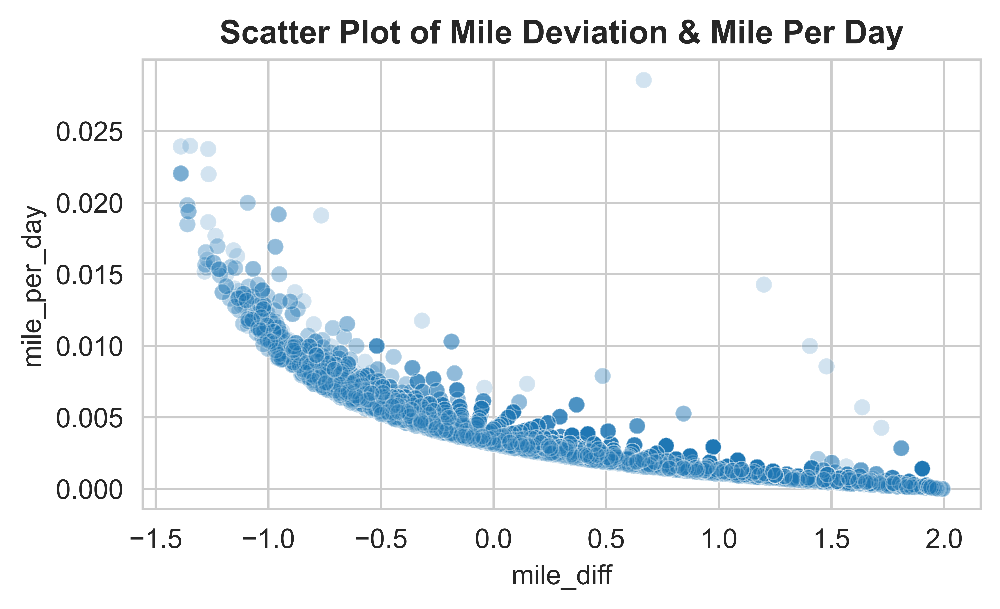

In [184]:
#Mile Deviation与Mile Per Day散点图
fig, ax = plt.subplots(1,1,constrained_layout=True, figsize=(5, 3), dpi=1080)
sns.scatterplot(x = "mile_diff", y = "mile_per_day",data = dfe,alpha = 0.2)
plt.title('Scatter Plot of Mile Deviation & Mile Per Day',fontweight='bold' )
plt.savefig('Scatter Plot of Mile Deviation & Mile Per Day', dpi=1080)
plt.show()

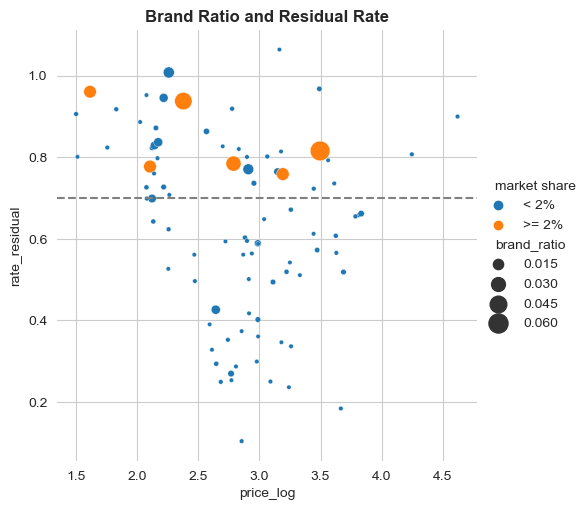

In [190]:
#品牌占比与保值率气泡图
dfb = dfe.groupby(dfe['brand']).mean()
lst1=list(dfb.index)
lst2=list(dfb['price_log'])
lst3=list(dfb['rate_residual'])
lst4=list(dfb['brand_ratio'])
df_brand = pd.DataFrame(columns=['price_log','rate_residual','brand_ratio'])
df_brand['price_log']=lst2
df_brand['rate_residual']=lst3
df_brand['brand_ratio']=lst4
df_brand['market share']=df_brand['brand_ratio'].apply(lambda x: '>= 2%' if x>=0.02 else '< 2%')


sns.set_style('whitegrid')
g = sns.relplot(
    data=df_brand,
    x="price_log", y="rate_residual",
    hue='market share',
    size="brand_ratio",sizes=(10, 200),
)



g.ax.xaxis.grid(True, "minor", linewidth=.25)
g.ax.yaxis.grid(True, "minor", linewidth=.65)
g.ax.axhline(0.7,linestyle='--',c='grey')
g.despine(left=True, bottom=True)
g.ax.set_title('Brand Ratio and Residual Rate',fontweight='bold')
g.savefig('Brand Ratio and Residual Rate', dpi=1080)

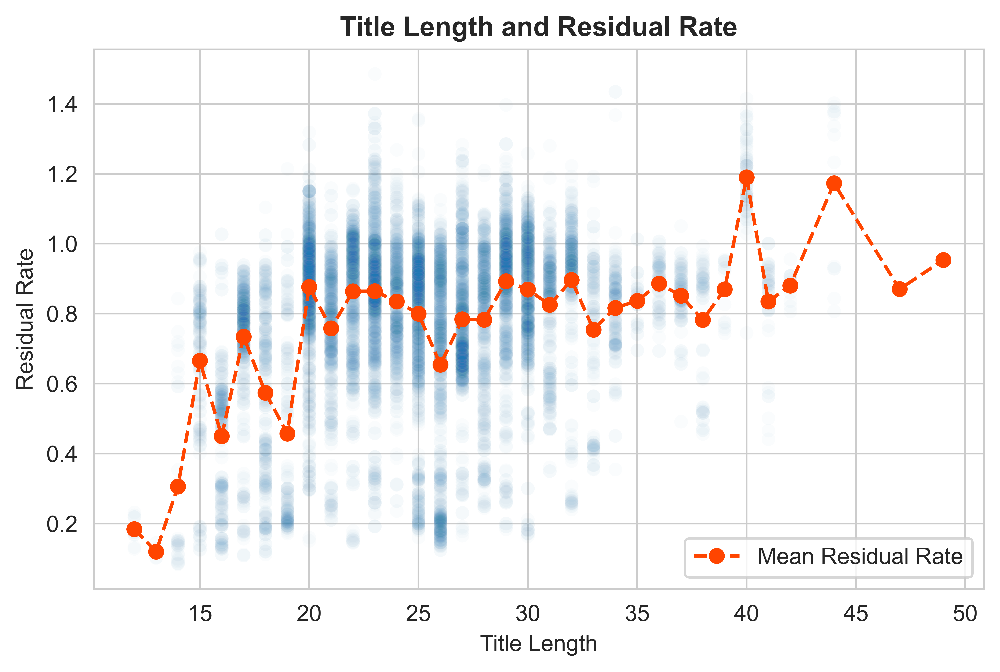

In [188]:
#标题长度与保值率相关性图
dfn = dfe.groupby(dfe['len']).mean()
lst1 = list(dfn['rate_residual'])

fig, ax = plt.subplots(1,1,constrained_layout=True, figsize=(6, 4), dpi=1080)
sns.set_style('whitegrid')
x = dfn.index
y = lst1


plt.plot(x,y,'o',linestyle='--',color = 'orangered',label="Mean Residual Rate")
plt.xlabel("Title Length")
plt.ylabel("Residual Rate")
plt.legend(loc = "best")
plt.title('Title Length and Residual Rate',fontweight='bold' )
sns.scatterplot(x = "len",y='rate_residual',alpha=0.02,data = dfe)
plt.savefig('Title Length and Residual Rate.png', dpi=1080)
plt.show()